# Mini-lab 1: Zillow Dataset Logistic Regression and SVMs  
MSDS 7331 Data Mining - Section 403 - Mini Lab 1

Team: Ivelin Angelov, Yao Yao, Kaitlin Kirasich, Albert Asuncion

<a id="top"></a>
## Contents
* <a href="#Imports">Imports</a>
* <a href="#Models">Models</a>
* <a href="#Advantages">Advantages of Each Model</a>
* <a href="#Feature">Feature Importance</a>
* <a href="#Insights">Insights</a>
________________________________________________________________________________________________________

<a id="Imports"></a>

# Imports


In [5]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Load Data, create y and X
We will use the Zillow dataset from our previous lab 1.

In [6]:
# load datasets here:
variables = pd.read_csv('../datasets/variables.csv').set_index('name')
X = pd.read_csv('../datasets/train.csv', low_memory=False)

y = (X['logerror'] > 0).astype(np.int32)

del X['logerror']
del X['transactiondate']
del X['parcelid']
del X['city']
# TODO fix me
del X['price_per_sqft']

'The dataset has %d rows and %d columns' % X.shape

'The dataset has 116761 rows and 49 columns'

# Deal with nominal data

In [7]:
nominal = variables[variables['type'].isin(['nominal'])]
nominal = nominal[nominal.index.isin(X.columns)]
nominal_data = X[nominal.index]

nominal_data = pd.get_dummies(nominal_data, drop_first=True)
nominal_data = nominal_data[nominal_data.columns[~nominal_data.columns.isin(nominal.index)]]

# Deal with continuous data

In [8]:
continuous = variables[~variables['type'].isin(['nominal'])]
continuous = continuous[continuous.index.isin(X.columns)]

X = X[continuous.index]
columns = X.columns

from sklearn.preprocessing import StandardScaler
# X = (X - µ) / σ

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

X = pd.DataFrame(X, columns=columns)


## Merge data

In [9]:
X = pd.concat([X, nominal_data], axis=1)

<a id="Models"></a>
<a href="#top">Back to Top</a>
# Models

<b>[50 points]</b>

<i>
Create a logistic regression model and a support vector machine model for the classification task involved with your dataset. Assess how well each model performs (use 80/20 training/testing split for your data). <b>Adjust parameters of the models to make them more accurate</b>. If your dataset size requires the use of stochastic gradient descent, then linear kernel only is fine to use. That is, the SGDClassifier is fine to use for optimizing logistic regression and linear support vector machines. For many problems, SGD will be required in order to train the SVM model in a reasonable timeframe. 
</i>

## Logistic Regression


In [10]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix


def logistic_regression_model(**params):
    X_train = params['X_train']
    y_train = params['y_train']
    X_test = params['X_test']
    del params['X_train']
    del params['X_test']
    del params['y_train']
    
    # remove this if it freezes
    params['n_jobs'] = -1
    
    clf = LogisticRegression(**params)
    clf.fit(X_train, y_train)
    return clf.predict(X_test), clf

yhat, _ = logistic_regression_model(X_train=X, y_train=y, X_test=X)

accuracy = float(sum(yhat==y)) / len(y)
print('Percentage accuracy:', accuracy)

pd.DataFrame(confusion_matrix(y, yhat),
    columns=['Predicted 1', 'Predicted 0'], 
    index=['Actual 1', 'Actual 0'], 
)

('Percentage accuracy:', 0.585889123936931)


,Predicted 1,Predicted 0
Actual 1,15445,36873
Actual 0,11479,52964


## Support Vector Machine Classifier

In [59]:
from sklearn.svm import SVC, LinearSVC


def support_vector_machine_model(**params):
    params['max_iter'] = 1000
    X_train = params['X_train']
    y_train = params['y_train']
    X_test = params['X_test']
    del params['X_train']
    del params['X_test']
    del params['y_train']

    #clf = SVC(kernel='linear')
    clf = LinearSVC(**params)
    clf.fit(X_train, y_train)
    return clf.predict(X_test), clf

yhat, _ = support_vector_machine_model(X_train=X, y_train=y, X_test=X)

accuracy = float(sum(yhat==y)) / len(y)
print('Percentage accuracy:', accuracy)

pd.DataFrame(confusion_matrix(y, yhat),
    columns=['Predicted 1', 'Predicted 0'], 
    index=['Actual 1', 'Actual 0'], 
)

('Percentage accuracy:', 0.5639554303234813)


,Predicted 1,Predicted 0
Actual 1,10162,42156
Actual 0,8757,55686


## Performance
<i>
Assess how well each model performs (use 80/20 training/testing split for your data). Adjust parameters of the models to make them more accurate. If your dataset size requires the use of stochastic gradient descent, then linear kernel only is fine to use. That is, the SGDClassifier is fine to use for optimizing logistic regression and linear support vector machines. For many problems, SGD will be required in order to train the SVM model in a reasonable timeframe.
</i>

In [9]:
from sklearn.model_selection import train_test_split

n_splits = 5
accuracies = []
final_accuracies = {}

for C in np.linspace(.01, 10, 10):
    for i in range(n_splits):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)

        yhat, _ = logistic_regression_model(
            X_train=X_train,
            y_train=y_train,
            X_test=X_test,
            C=C
        )
        
        accuracy = float(sum(yhat==y_test)) / len(y_test)
        accuracies.append(accuracy)

    print('Final average accuracy: ', np.mean(accuracies))
    final_accuracies[C] = np.mean(accuracies)
    
final_accuracies = pd.Series(final_accuracies)
final_accuracies.index.name = 'C values'

# plt.title('Distribution of Missing Values', fontsize=15)
# plt.xlabel('Number of Missing Values', fontsize=15)
# plt.ylabel('Number of Rows', fontsize=15);

final_accuracies.plot()

SystemExit: 

('Final average accuracy for', 'l1', 0.56825675502076822)
('Final average accuracy for', 'l2', 0.56871708131717558)


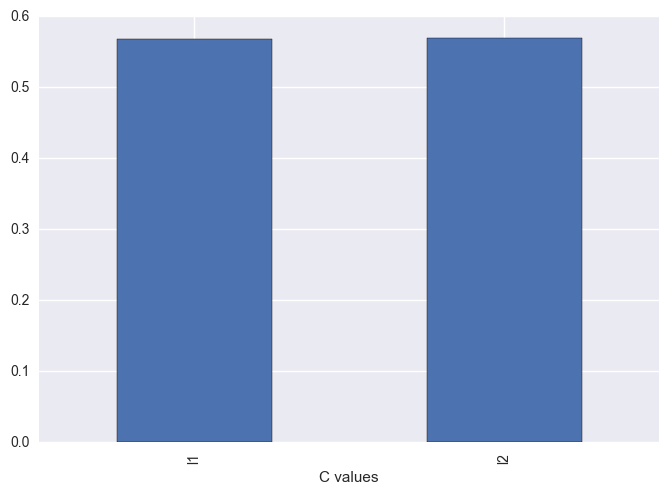

In [12]:
n_splits = 2
accuracies = []
final_accuracies = {}

for penalty in ['l1', 'l2']:
    for i in range(n_splits):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)

        yhat, _ = logistic_regression_model(
            X_train=X_train,
            y_train=y_train,
            X_test=X_test,
            penalty=penalty
        )
        
        accuracy = float(sum(yhat==y_test)) / len(y_test)
        accuracies.append(accuracy)

    print('Final average accuracy for', penalty, np.mean(accuracies))
    final_accuracies[penalty] = np.mean(accuracies)
    
final_accuracies = pd.Series(final_accuracies)
final_accuracies.index.name = 'C values'

final_accuracies.plot(kind='bar')

<a id="Advantages"></a>
<a href="#top">Back to Top</a>
## Advantages of Each Model
<b>[10 points]</b>

<i>
Discuss the advantages of each model for each classification task. Does one type of model offer superior performance over another in terms of prediction accuracy? In terms of training time or efficiency? Explain in detail. 
</i>

<a id="Feature"></a>
<a href="#top">Back to Top</a>
## Feature Importance
<b>[30 points]</b>
    
<i>
Use the weights from logistic regression to interpret the importance of different features for the classification task. Explain your interpretation in detail. Why do you think some variables are more important?
</i>

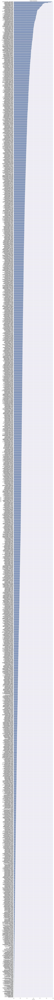

In [18]:
_, clf = logistic_regression_model(X_train=X, y_train=y, X_test=X, C=2)

index = pd.Index(X.columns, name='Variable Name')

importance = pd.Series(np.abs(clf.coef_[0]), index=index)
importance.sort()

fig, ax = plt.subplots(figsize=(10,300))
importance.plot(kind='barh', ax=ax)
plt.title('Feature Importance')
plt.xlabel('Importance', fontsize=8);

<a id="Insights"></a>
<a href="#top">Back to Top</a>
## Insights
<b>[10 points]</b>

<i>
Look at the chosen support vectors for the classification task. Do these provide any insight into the data? Explain. If you used stochastic gradient descent (and therefore did not explicitly solve for support vectors), try subsampling your data to train the SVC model — then analyze the support vectors from the subsampled dataset. 
</i>

In [9]:
clf = support_vector_machine_model(X_train=X, y_train=y, X_test=X, C=2)

# get support vectors
clf.support_vectors_
# get indices of support vectors
clf.support_ 
# get number of support vectors for each class
clf.n_support_ 

<a href="#top">Back to Top</a>